<a href="https://colab.research.google.com/github/derektorquette/reconhecimento-de-emocoes-com-tensorflow-e-python/blob/main/deteccao_emocoes_redesneurais.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Etapa 1 - Importanto as Bibliotecas

In [ ]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import zipfile

In [ ]:
%tensorflow_version 2.x

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.20.0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Etapa 2 - Acessando a base com fotos de expressões faciais

In [ ]:
patch = "/content/drive/MyDrive/CURSOS LIVRES FORMAÇÃO COMPLEMENTAR/Reconhecimento de Emoções com TensorFlow 2.0 e Python/Material/Material/fer2013.zip"
zip_object = zipfile.ZipFile(file=patch, mode="r")
zip_object.extractall("./")


In [ ]:
data = pd.read_csv('fer2013/fer2013.csv')
data.tail()

,emotion,pixels,Usage
35882,6,50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...,PrivateTest
35883,3,178 174 172 173 181 188 191 194 196 199 200 20...,PrivateTest
35884,0,17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...,PrivateTest
35885,3,30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...,PrivateTest
35886,2,19 13 14 12 13 16 21 33 50 57 71 84 97 108 122...,PrivateTest


Text(0.5, 1.0, 'imagens x emoções')

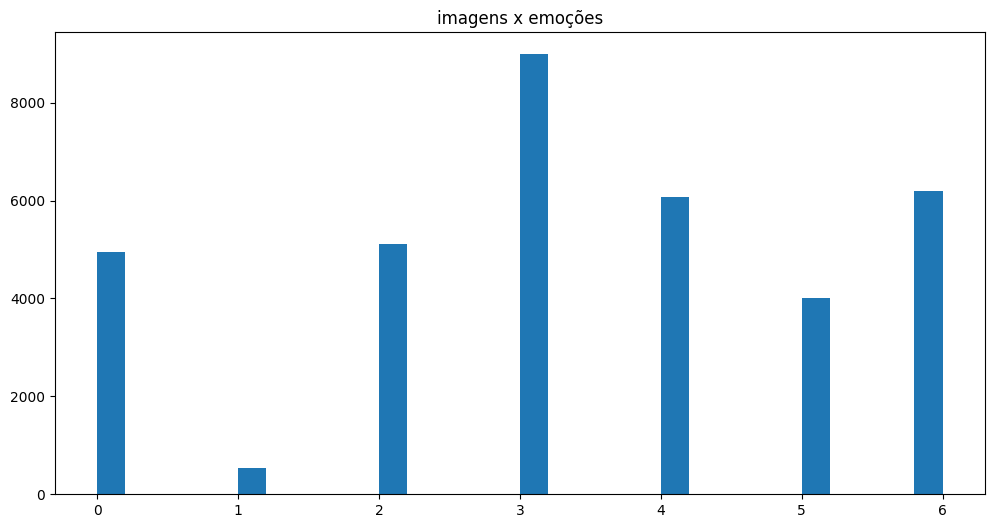

In [ ]:
plt.figure(figsize=(12,6))
plt.hist(data['emotion'], bins = 30)
plt.title('imagens x emoções')

# Classes: ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

#Etapa 3 - Pré-processamento

In [ ]:
pixels = data['pixels'].tolist()
pixels

['70 80 82 72 58 58 60 63 54 58 60 48 89 115 121 119 115 110 98 91 84 84 90 99 110 126 143 153 158 171 169 172 169 165 129 110 113 107 95 79 66 62 56 57 61 52 43 41 65 61 58 57 56 69 75 70 65 56 54 105 146 154 151 151 155 155 150 147 147 148 152 158 164 172 177 182 186 189 188 190 188 180 167 116 95 103 97 77 72 62 55 58 54 56 52 44 50 43 54 64 63 71 68 64 52 66 119 156 161 164 163 164 167 168 170 174 175 176 178 179 183 187 190 195 197 198 197 198 195 191 190 145 86 100 90 65 57 60 54 51 41 49 56 47 38 44 63 55 46 52 54 55 83 138 157 158 165 168 172 171 173 176 179 179 180 182 185 187 189 189 192 197 200 199 196 198 200 198 197 177 91 87 96 58 58 59 51 42 37 41 47 45 37 35 36 30 41 47 59 94 141 159 161 161 164 170 171 172 176 178 179 182 183 183 187 189 192 192 194 195 200 200 199 199 200 201 197 193 111 71 108 69 55 61 51 42 43 56 54 44 24 29 31 45 61 72 100 136 150 159 163 162 163 170 172 171 174 177 177 180 187 186 187 189 192 192 194 195 196 197 199 200 201 200 197 201 137 58 98 9

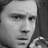

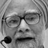

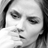

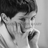

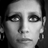

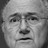

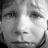

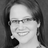

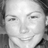

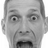

In [ ]:
largura, altura = 48, 48
faces = []
amostras = 0
for pixel_sequence in pixels:
  face = [int(pixel) for pixel in pixel_sequence.split(' ')]
  face = np.asarray(face).reshape(largura, altura)
  faces.append(face.astype('float32'))

  if amostras < 10:
    cv2_imshow(face)
  amostras += 1

In [ ]:
print('Número total de imagens no dataset: ', str(len(faces)))

Número total de imagens no dataset:  35887


In [ ]:
faces = np.asanyarray(faces)

In [ ]:
faces.shape

(35887, 48, 48)

In [ ]:
faces = np.expand_dims(faces, -1)
faces.shape

# quantidade de imagens, altura, largura e qtd de canais

(35887, 48, 48, 1)

In [ ]:
def normalizar(x):
  x = x / 255.0
  return x

In [ ]:
faces = normalizar(faces)

In [ ]:
faces

array([[[[0.27450982],
         [0.3137255 ],
         [0.32156864],
         ...,
         [0.20392157],
         [0.16862746],
         [0.16078432]],

        [[0.25490198],
         [0.23921569],
         [0.22745098],
         ...,
         [0.21960784],
         [0.20392157],
         [0.17254902]],

        [[0.19607843],
         [0.16862746],
         [0.21176471],
         ...,
         [0.19215687],
         [0.21960784],
         [0.18431373]],

        ...,

        [[0.35686275],
         [0.25490198],
         [0.16470589],
         ...,
         [0.28235295],
         [0.21960784],
         [0.16862746]],

        [[0.3019608 ],
         [0.32156864],
         [0.30980393],
         ...,
         [0.4117647 ],
         [0.27450982],
         [0.18039216]],

        [[0.3019608 ],
         [0.28235295],
         [0.32941177],
         ...,
         [0.41568628],
         [0.42745098],
         [0.32156864]]],


       [[[0.5921569 ],
         [0.5882353 ],
         [0.57

In [ ]:
emocoes = pd.get_dummies(data['emotion']).values

In [ ]:
emocoes[0]

array([ True, False, False, False, False, False, False])

#Etapa 4 - Imports do Tensorflow/Keras

In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.models import model_from_json

#Etapa 5 - Dividir em Conjuntos para treinamento e validação

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(faces, emocoes, test_size= 0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size= 0.1, random_state=41)


In [ ]:
print('Número de imagens no conjunto de treinamento:', len(X_train))
print('Número de imagens no conjunto de teste', len(X_test))
print('Número de imagens no conjunto de tre:', len(X_val))

Número de imagens no conjunto de treinamento: 29068
Número de imagens no conjunto de teste 3589
Número de imagens no conjunto de tre: 3230


In [ ]:
np.save('mod_xtest', X_test)
np.save('mod_ytest', y_test)

# Etapa 6 - Arquitetura do Modelo (CNN)


In [ ]:
num_features = 64 # número de filtros da rede
num_labels = 7 # sete classes
batch_size = 64 # divisão dos registros para a rede neural
epochs = 100 # quantidade de épocas
width, height = 48, 48

model = Sequential()

model.add(Conv2D(num_features, kernel_size=(3, 3), activation='relu', input_shape=(width, height, 1), data_format='channels_last', kernel_regularizer=l2(0.01)))
model.add(Conv2D(num_features, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Dropout(0.5)) # zerar os neurônios, podemos colocar até 0.2

model.add(Conv2D(2*num_features, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2*num_features, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Dropout(0.5))

model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2*2*num_features, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Dropout(0.5))

model.add(Conv2D(2*2*2*num_features, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2*2*2*num_features, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Dropout(0.5))

model.add(Flatten())

model.add(Dense(2*2*2*num_features, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(2*2*num_features, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(2*num_features, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(num_labels, activation='softmax'))

model.summary()




/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 46, 46, 64)     │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 46, 46, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 46, 46, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 23, 23, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 23, 23, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 23, 23, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 23, 23, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 11, 11, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 11, 11, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 11, 11, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 11, 11, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 5, 5, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 5, 5, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 5, 5, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 5,905,863 (22.53 MB)

 Trainable params: 5,902,151 (22.51 MB)

 Non-trainable params: 3,712 (14.50 KB)

# Etapa 7 - Copilando o Modelo

In [ ]:
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7),
              metrics=['accuracy'])

arquivo_modelo = 'modelo_expressoes.h5'
arquivo_modelo_json = 'modelo_expressoes.json'

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.9, patience=3, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=8, verbose=1, mode='auto')
checkpointer = ModelCheckpoint(arquivo_modelo, monitor='val_loss', verbose=1, save_best_only=True)



## Salvando a arquitetura do modelo em um arquivo JSON

In [ ]:
model_json = model.to_json()
with open(arquivo_modelo_json, "w") as json_file:
    json_file.write(model_json)

# Etapa 8 - Treinando o Modelo

In [ ]:
history = model.fit(np.array(X_train), np.array(y_train),
                    batch_size=batch_size,
                    epochs=epochs,
                    verbose=1,
                    validation_data=(np.array(X_val), np.array(y_val)),
                    shuffle=True,
                    callbacks=[lr_reducer, checkpointer, early_stopping])

Epoch 1/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.1930 - loss: 2.3464
Epoch 1: val_loss improved from None to 1.81644, saving model to modelo_expressoes.h5



Epoch 1: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 66s 96ms/step - accuracy: 0.2147 - loss: 2.0026 - val_accuracy: 0.2594 - val_loss: 1.8164 - learning_rate: 0.0010
Epoch 2/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.2380 - loss: 1.8432
Epoch 2: val_loss improved from 1.81644 to 1.80693, saving model to modelo_expressoes.h5



Epoch 2: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - accuracy: 0.2440 - loss: 1.8337 - val_accuracy: 0.2594 - val_loss: 1.8069 - learning_rate: 0.0010
Epoch 3/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.2491 - loss: 1.8231
Epoch 3: val_loss improved from 1.80693 to 1.79070, saving model to modelo_expressoes.h5



Epoch 3: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.2532 - loss: 1.8132 - val_accuracy: 0.2616 - val_loss: 1.7907 - learning_rate: 0.0010
Epoch 4/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.2871 - loss: 1.7528
Epoch 4: val_loss did not improve from 1.79070
455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step - accuracy: 0.2972 - loss: 1.7304 - val_accuracy: 0.2347 - val_loss: 1.8502 - learning_rate: 0.0010
Epoch 5/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.3433 - loss: 1.6438
Epoch 5: val_loss improved from 1.79070 to 1.58610, saving model to modelo_expressoes.h5



Epoch 5: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.3541 - loss: 1.6280 - val_accuracy: 0.3588 - val_loss: 1.5861 - learning_rate: 0.0010
Epoch 6/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.3924 - loss: 1.5485
Epoch 6: val_loss improved from 1.58610 to 1.51805, saving model to modelo_expressoes.h5



Epoch 6: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.3967 - loss: 1.5392 - val_accuracy: 0.4248 - val_loss: 1.5181 - learning_rate: 0.0010
Epoch 7/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.4036 - loss: 1.4941
Epoch 7: val_loss did not improve from 1.51805
455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.4144 - loss: 1.4790 - val_accuracy: 0.3186 - val_loss: 1.7923 - learning_rate: 0.0010
Epoch 8/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.4311 - loss: 1.4454
Epoch 8: val_loss did not improve from 1.51805
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.4368 - loss: 1.4392 - val_accuracy: 0.3220 - val_loss: 1.6243 - learning_rate: 0.0010
Epoch 9/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.4583 - loss: 1.4032
Epoch 9: val_loss improved from 1.51805 to 1.32688, saving model to modelo_expressoes.h5



Epoch 9: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.4620 - loss: 1.3978 - val_accuracy: 0.4805 - val_loss: 1.3269 - learning_rate: 0.0010
Epoch 10/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.4763 - loss: 1.3668
Epoch 10: val_loss did not improve from 1.32688
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.4783 - loss: 1.3628 - val_accuracy: 0.4498 - val_loss: 1.4441 - learning_rate: 0.0010
Epoch 11/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.4976 - loss: 1.3217
Epoch 11: val_loss improved from 1.32688 to 1.28513, saving model to modelo_expressoes.h5



Epoch 11: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.4962 - loss: 1.3266 - val_accuracy: 0.5173 - val_loss: 1.2851 - learning_rate: 0.0010
Epoch 12/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.5125 - loss: 1.3029
Epoch 12: val_loss did not improve from 1.28513
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.5135 - loss: 1.2998 - val_accuracy: 0.4932 - val_loss: 1.3075 - learning_rate: 0.0010
Epoch 13/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.5335 - loss: 1.2567
Epoch 13: val_loss improved from 1.28513 to 1.22159, saving model to modelo_expressoes.h5



Epoch 13: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.5266 - loss: 1.2663 - val_accuracy: 0.5406 - val_loss: 1.2216 - learning_rate: 0.0010
Epoch 14/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5328 - loss: 1.2468
Epoch 14: val_loss improved from 1.22159 to 1.19011, saving model to modelo_expressoes.h5



Epoch 14: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.5365 - loss: 1.2409 - val_accuracy: 0.5514 - val_loss: 1.1901 - learning_rate: 0.0010
Epoch 15/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5526 - loss: 1.2102
Epoch 15: val_loss did not improve from 1.19011
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.5531 - loss: 1.2170 - val_accuracy: 0.5551 - val_loss: 1.2014 - learning_rate: 0.0010
Epoch 16/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5603 - loss: 1.1930
Epoch 16: val_loss improved from 1.19011 to 1.17775, saving model to modelo_expressoes.h5



Epoch 16: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.5590 - loss: 1.1985 - val_accuracy: 0.5601 - val_loss: 1.1778 - learning_rate: 0.0010
Epoch 17/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5681 - loss: 1.1661
Epoch 17: val_loss improved from 1.17775 to 1.11747, saving model to modelo_expressoes.h5



Epoch 17: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.5671 - loss: 1.1673 - val_accuracy: 0.5864 - val_loss: 1.1175 - learning_rate: 0.0010
Epoch 18/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5760 - loss: 1.1517
Epoch 18: val_loss improved from 1.11747 to 1.09139, saving model to modelo_expressoes.h5



Epoch 18: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.5798 - loss: 1.1475 - val_accuracy: 0.5985 - val_loss: 1.0914 - learning_rate: 0.0010
Epoch 19/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5924 - loss: 1.1243
Epoch 19: val_loss improved from 1.09139 to 1.07808, saving model to modelo_expressoes.h5



Epoch 19: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.5887 - loss: 1.1321 - val_accuracy: 0.6028 - val_loss: 1.0781 - learning_rate: 0.0010
Epoch 20/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5979 - loss: 1.1073
Epoch 20: val_loss improved from 1.07808 to 1.06139, saving model to modelo_expressoes.h5



Epoch 20: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.5965 - loss: 1.1112 - val_accuracy: 0.6130 - val_loss: 1.0614 - learning_rate: 0.0010
Epoch 21/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6094 - loss: 1.0675
Epoch 21: val_loss did not improve from 1.06139
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6104 - loss: 1.0721 - val_accuracy: 0.5997 - val_loss: 1.0811 - learning_rate: 0.0010
Epoch 22/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6170 - loss: 1.0501
Epoch 22: val_loss did not improve from 1.06139
455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 51ms/step - accuracy: 0.6150 - loss: 1.0606 - val_accuracy: 0.6121 - val_loss: 1.0688 - learning_rate: 0.0010
Epoch 23/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6297 - loss: 1.0281
Epoch 23: val_loss improved from 1.06139 to 1.05785, saving model to modelo_expressoes.h5



Epoch 23: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6245 - loss: 1.0389 - val_accuracy: 0.6149 - val_loss: 1.0579 - learning_rate: 0.0010
Epoch 24/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6340 - loss: 1.0062
Epoch 24: val_loss did not improve from 1.05785
455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6300 - loss: 1.0200 - val_accuracy: 0.5994 - val_loss: 1.0911 - learning_rate: 0.0010
Epoch 25/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6318 - loss: 1.0127
Epoch 25: val_loss improved from 1.05785 to 1.05152, saving model to modelo_expressoes.h5



Epoch 25: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6346 - loss: 1.0131 - val_accuracy: 0.6146 - val_loss: 1.0515 - learning_rate: 0.0010
Epoch 26/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6439 - loss: 0.9864
Epoch 26: val_loss improved from 1.05152 to 1.03659, saving model to modelo_expressoes.h5



Epoch 26: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6457 - loss: 0.9825 - val_accuracy: 0.6195 - val_loss: 1.0366 - learning_rate: 0.0010
Epoch 27/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6498 - loss: 0.9508
Epoch 27: val_loss improved from 1.03659 to 1.03083, saving model to modelo_expressoes.h5



Epoch 27: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6510 - loss: 0.9592 - val_accuracy: 0.6300 - val_loss: 1.0308 - learning_rate: 0.0010
Epoch 28/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.6611 - loss: 0.9370
Epoch 28: val_loss improved from 1.03083 to 1.02492, saving model to modelo_expressoes.h5



Epoch 28: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6558 - loss: 0.9507 - val_accuracy: 0.6328 - val_loss: 1.0249 - learning_rate: 0.0010
Epoch 29/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6695 - loss: 0.9177
Epoch 29: val_loss did not improve from 1.02492
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6689 - loss: 0.9211 - val_accuracy: 0.6229 - val_loss: 1.0416 - learning_rate: 0.0010
Epoch 30/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6779 - loss: 0.8911
Epoch 30: val_loss did not improve from 1.02492
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6755 - loss: 0.8977 - val_accuracy: 0.6356 - val_loss: 1.0253 - learning_rate: 0.0010
Epoch 31/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6862 - loss: 0.8792
Epoch 31: val_loss improved from 1.02492 to 1.01485, saving model to modelo_expressoes.h5



Epoch 31: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6849 - loss: 0.8838 - val_accuracy: 0.6356 - val_loss: 1.0149 - learning_rate: 0.0010
Epoch 32/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6990 - loss: 0.8423
Epoch 32: val_loss did not improve from 1.01485
455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 51ms/step - accuracy: 0.6889 - loss: 0.8692 - val_accuracy: 0.6353 - val_loss: 1.0261 - learning_rate: 0.0010
Epoch 33/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.7001 - loss: 0.8425
Epoch 33: val_loss did not improve from 1.01485
455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 51ms/step - accuracy: 0.6964 - loss: 0.8536 - val_accuracy: 0.6393 - val_loss: 1.0242 - learning_rate: 0.0010
Epoch 34/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.7052 - loss: 0.8244
Epoch 34: val_loss improved from 1.01485 to 1.00805, saving model to modelo_expressoes.h5



Epoch 34: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.7022 - loss: 0.8321 - val_accuracy: 0.6381 - val_loss: 1.0081 - learning_rate: 0.0010
Epoch 35/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.7109 - loss: 0.8089
Epoch 35: val_loss did not improve from 1.00805
455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.7073 - loss: 0.8234 - val_accuracy: 0.6251 - val_loss: 1.0859 - learning_rate: 0.0010
Epoch 36/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.7184 - loss: 0.7954
Epoch 36: val_loss improved from 1.00805 to 1.00229, saving model to modelo_expressoes.h5



Epoch 36: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.7142 - loss: 0.8091 - val_accuracy: 0.6551 - val_loss: 1.0023 - learning_rate: 0.0010
Epoch 37/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.7271 - loss: 0.7704
Epoch 37: val_loss did not improve from 1.00229
455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 51ms/step - accuracy: 0.7226 - loss: 0.7840 - val_accuracy: 0.6248 - val_loss: 1.0652 - learning_rate: 0.0010
Epoch 38/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.7338 - loss: 0.7625
Epoch 38: val_loss did not improve from 1.00229
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.7250 - loss: 0.7799 - val_accuracy: 0.6232 - val_loss: 1.1313 - learning_rate: 0.0010
Epoch 39/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.7291 - loss: 0.7504
Epoch 39: val_loss improved from 1.00229 to 0.99725, saving model to modelo_expressoes.h5



Epoch 39: finished saving model to modelo_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.7269 - loss: 0.7610 - val_accuracy: 0.6511 - val_loss: 0.9972 - learning_rate: 0.0010
Epoch 40/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.7383 - loss: 0.7308
Epoch 40: val_loss did not improve from 0.99725
455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 51ms/step - accuracy: 0.7352 - loss: 0.7389 - val_accuracy: 0.6601 - val_loss: 1.0108 - learning_rate: 0.0010
Epoch 41/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.7452 - loss: 0.7210
Epoch 41: val_loss did not improve from 0.99725
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.7435 - loss: 0.7297 - val_accuracy: 0.6480 - val_loss: 1.0320 - learning_rate: 0.0010
Epoch 42/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.7525 - loss: 0.7021
Epoch 42: ReduceLROnPlateau reducing learning rate to 0.0009000000427477062.

Epoch 42: val_loss did not improve from 0.99725
455/455 ━━━━━━━━━━━━━━━━━

In [ ]:
print(history.history)

{'accuracy': [0.21470345556735992, 0.24404843151569366, 0.25323379039764404, 0.29716527462005615, 0.3540663421154022, 0.3966561257839203, 0.4144075810909271, 0.4368033707141876, 0.46195128560066223, 0.4782922863960266, 0.4961813688278198, 0.5135200023651123, 0.5265583992004395, 0.5364662408828735, 0.5531168580055237, 0.559033989906311, 0.5670840740203857, 0.5798472762107849, 0.5886541604995728, 0.5964978933334351, 0.6103619337081909, 0.6149718165397644, 0.6244667768478394, 0.6300399303436279, 0.6346498131752014, 0.6456584334373474, 0.6510251760482788, 0.6558414697647095, 0.6689486503601074, 0.6755194664001465, 0.6848768591880798, 0.6888675093650818, 0.6963671445846558, 0.7021811008453369, 0.707306981086731, 0.7142218351364136, 0.7226159572601318, 0.724989652633667, 0.7269161939620972, 0.7352070808410645, 0.7434980273246765, 0.7453213334083557, 0.7575340867042542, 0.7641392350196838, 0.7672354578971863, 0.7796546220779419, 0.7868102192878723], 'loss': [2.00260853767395, 1.83370292186737

## Gerando gráfico da melhoria em cada etapa de treinamento

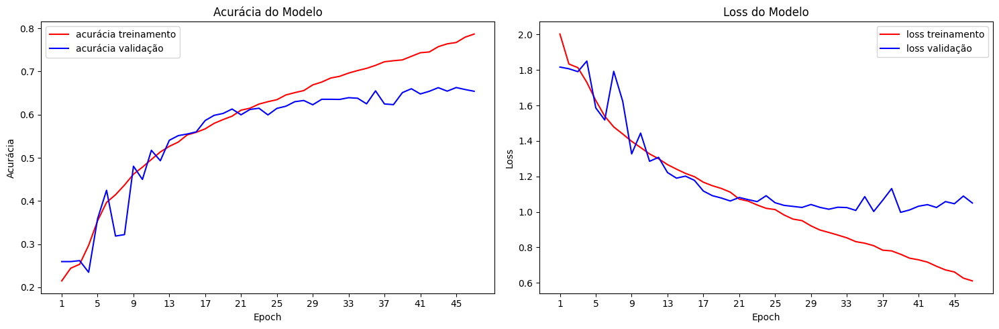

In [ ]:
def plota_historico_modelo(historico_modelo):
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))

    epochs = range(1, len(historico_modelo.history['accuracy']) + 1)
    total_epochs = len(historico_modelo.history['accuracy'])

    # Define o intervalo — muda o 10 para 5 se quiser mais marcações
    intervalo = max(1, total_epochs // 10)
    ticks = range(1, total_epochs + 1, intervalo)

    # Gráfico de Acurácia
    axs[0].plot(epochs, historico_modelo.history['accuracy'], 'r')
    axs[0].plot(epochs, historico_modelo.history['val_accuracy'], 'b')
    axs[0].set_title('Acurácia do Modelo')
    axs[0].set_ylabel('Acurácia')
    axs[0].set_xlabel('Epoch')
    axs[0].set_xticks(ticks)  # ✅ mostra só 10 marcações no eixo
    axs[0].legend(['acurácia treinamento', 'acurácia validação'], loc='best')

    # Gráfico de Loss
    axs[1].plot(epochs, historico_modelo.history['loss'], 'r')
    axs[1].plot(epochs, historico_modelo.history['val_loss'], 'b')
    axs[1].set_title('Loss do Modelo')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_xticks(ticks)  # ✅ mesmo intervalo
    axs[1].legend(['loss treinamento', 'loss validação'], loc='best')

    fig.savefig('historico_modelo.png')

    plt.tight_layout()
    plt.show()

plota_historico_modelo(history)


## Verificando a Acurácia do Modelo

In [ ]:
scores = model.evaluate(np.array(X_test), np.array(y_test), batch_size=batch_size)


57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.6442 - loss: 1.1238


In [ ]:
scores

[1.1238210201263428, 0.6441906094551086]

In [ ]:
print('Acurácia: ' + str(scores[1]))
print( 'Erro: ' + str(scores[0]))

Acurácia: 0.6441906094551086
Erro: 1.1238210201263428


## Carregamento dos dados para gerar a matriz de confusão

In [ ]:
true_y = []
pred_y = []
x = np.load('mod_xtest.npy')
y = np.load('mod_ytest.npy')


In [ ]:
y[0]

array([False, False, False,  True, False, False, False])

In [ ]:
# carregamento do modelo
json_file = open(arquivo_modelo_json, 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights(arquivo_modelo)

In [ ]:
y_pred = loaded_model.predict(x)

113/113 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step


In [ ]:
y_pred[0]

array([2.0118167e-03, 8.3562736e-07, 7.1213767e-03, 9.0716457e-01,
       2.9979227e-03, 1.2037409e-02, 6.8666048e-02], dtype=float32)

In [ ]:
yp = y_pred.tolist()
yt = y.tolist()
count = 0

In [ ]:
len(y)

3589

In [ ]:
for i in range(len(y)):
  yy = max(yp[i])
  yyt = max(yt[i])
pred_y.append(yp[i].index(yy))
true_y.append(yt[i].index(yyt))
if (yp[i].index(yy) == yt[i].index(yyt)):
  count += 1
acc = (count / len(y)) *100
print(acc)

0.02786291446085261


In [ ]:
np.save('truey_mode01', true_y)
np.save('predy_mode01', pred_y)

## Gerando a Matriz de Confusão ** não deu muito certo

In [ ]:
from sklearn.metrics import confusion_matrix


In [ ]:
y_true = np.load('truey_mode01.npy')
y_pred = np.load('predy_mode01.npy')

In [ ]:
from sklearn.metrics import confusion_matrix

labels = ['Raiva', 'Nojo', 'Medo', 'Feliz', 'Triste', 'Surpreso', 'Neutro']

cm = confusion_matrix(y_true, y_pred, labels=labels)
print(cm)


[[3 0 0 0 0 0 0]
 [0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0]]


Text(0.5, 0, 'Previsto')

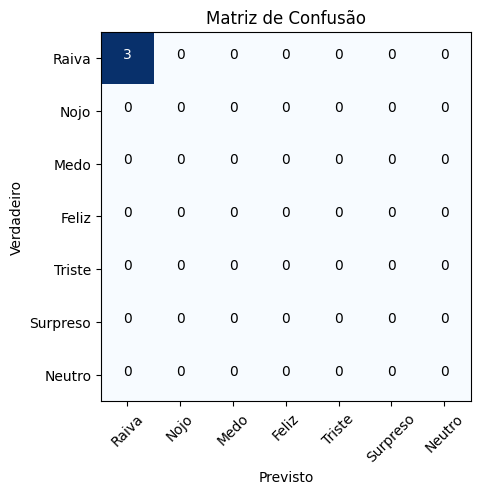

In [ ]:
import itertools
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Matriz de Confusão')
plt.colorbar
tick_marks = np.arange(len(labels))
plt.xticks(tick_marks, labels, rotation=45)
plt.yticks(tick_marks, labels)
fmt = 'd'
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
  plt.text(j, i, format(cm[i, j], fmt),
           horizontalalignment="center",
           color="white" if cm[i, j] > thresh else "black")
plt.ylabel('Verdadeiro')
plt.xlabel('Previsto')

# Testando o Modelo

In [ ]:
imagem = cv2.imread('/content/drive/MyDrive/CURSOS LIVRES FORMAÇÃO COMPLEMENTAR/Reconhecimento de Emoções com TensorFlow 2.0 e Python/Material/Material/testes/teste02.jpg')

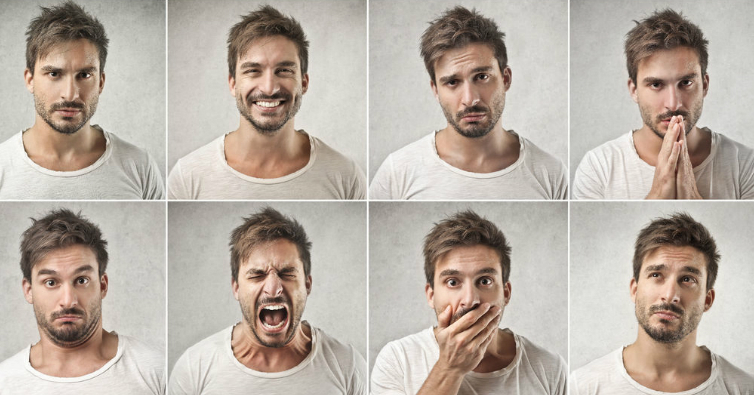

In [ ]:
cv2_imshow(imagem)

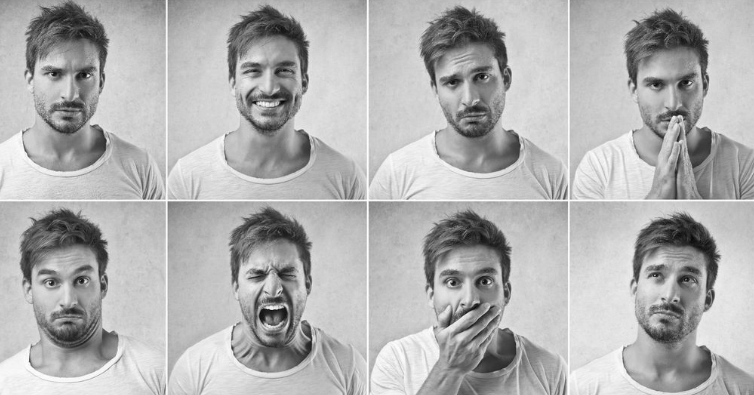

In [ ]:
original = imagem.copy()
gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

In [ ]:
face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/CURSOS LIVRES FORMAÇÃO COMPLEMENTAR/Reconhecimento de Emoções com TensorFlow 2.0 e Python/Material/Material/haarcascade_frontalface_default.xml')
faces = face_cascade.detectMultiScale(gray, 1.1, 3)


In [ ]:
faces

array([[224,  35,  90,  90],
       [625,  49,  91,  91],
       [ 23,  41,  92,  92],
       [420,  43,  97,  97],
       [420, 242,  97,  97],
       [ 18, 243,  98,  98],
       [229, 242,  85,  85],
       [627, 241,  91,  91]], dtype=int32)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


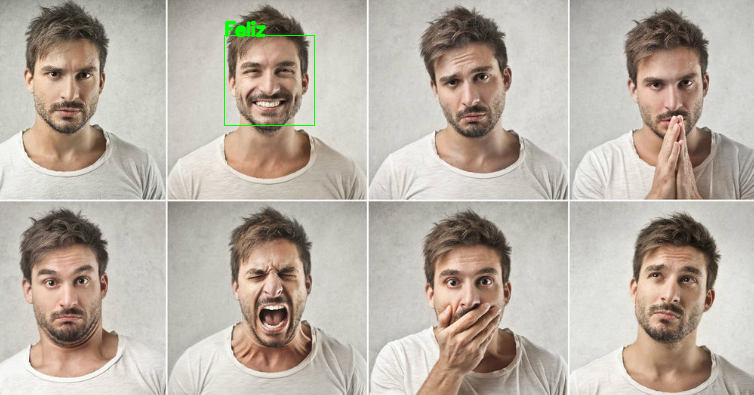

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


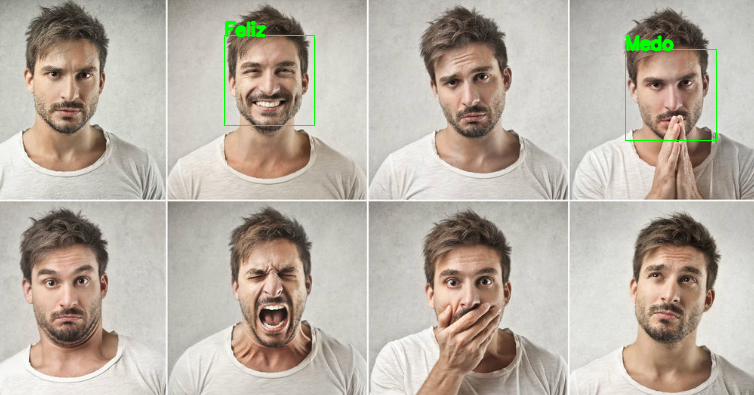

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


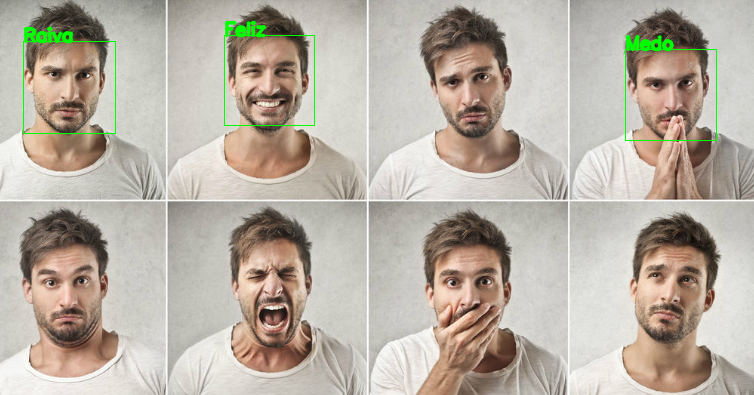

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


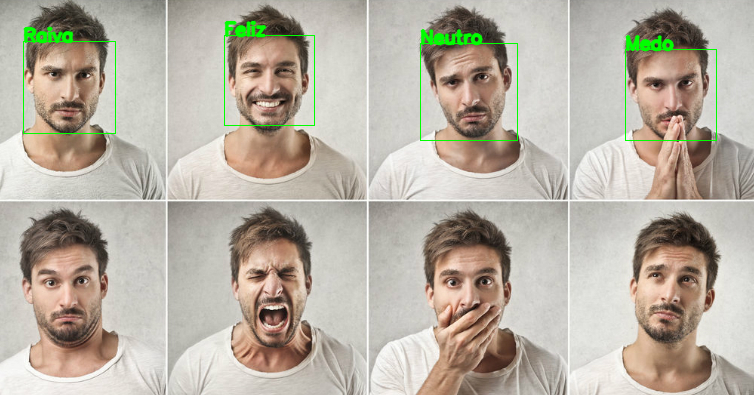

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


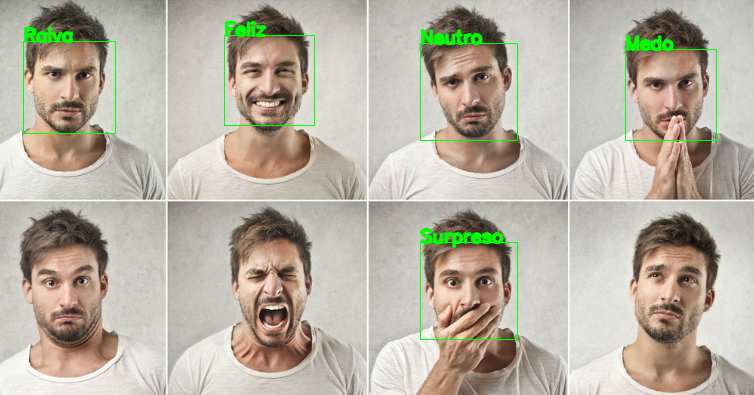

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


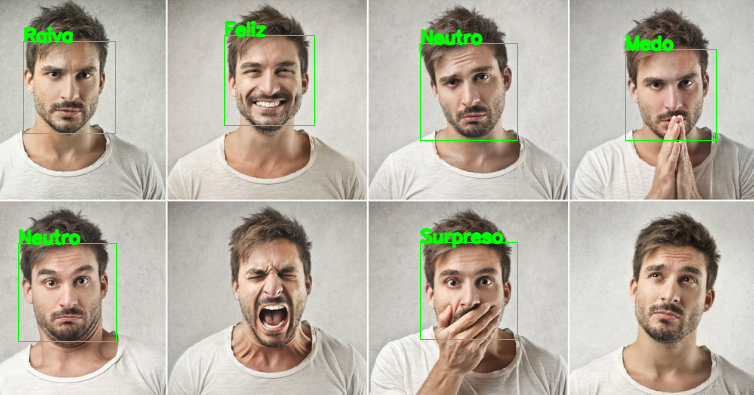

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


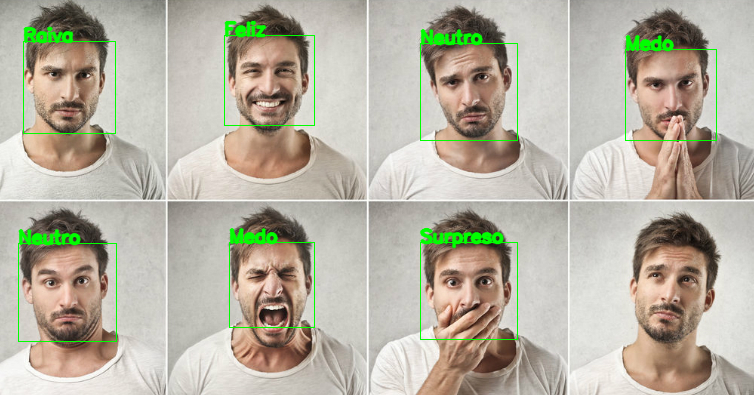

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


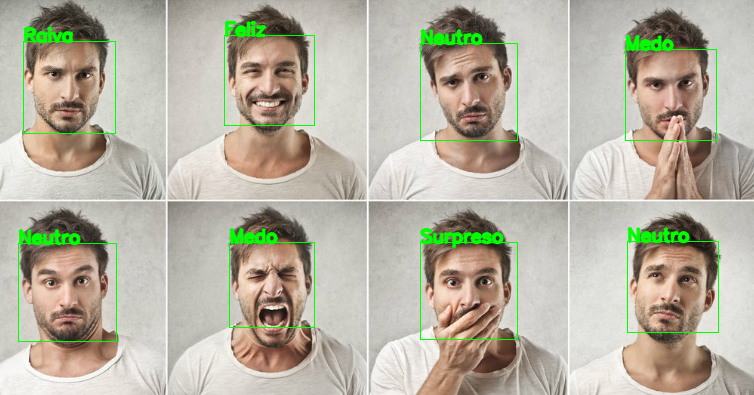

In [ ]:
for (x, y, w, h) in faces:
  cv2.rectangle(original, (x, y), (x + w, y + h), (0, 255, 0), 1)
  roi_gray = gray[y:y + h, x:x + w]
  roi_gray = roi_gray.astype('float32') / 255.0
  cropped_img = np.expand_dims(np.expand_dims(cv2.resize(roi_gray, (48, 48)), -1), 0)
  prediction = loaded_model.predict(cropped_img) [0]
  cv2.putText(original, expressoes[int(np.argmax(prediction))], (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2, cv2.LINE_AA)



  cv2_imshow(original)